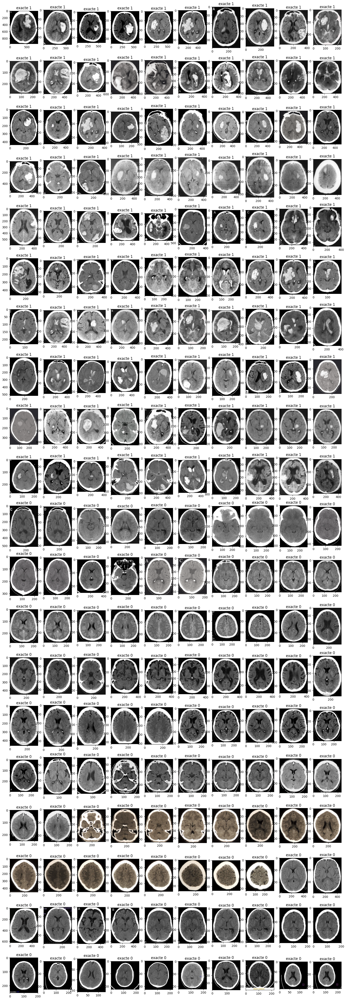

In [53]:
import math
import pandas as pd
import numpy as np
import glob
import cv2
import matplotlib.pyplot as plt

# Load labels from a CSV file
labels_df = pd.read_csv('labels.csv')
labels = np.array(labels_df[' hemorrhage'].tolist())

# Load image files
files = sorted(glob.glob('./head_ct/head_ct/*.png'))
images = np.array([cv2.imread(path) for path in files], dtype=object)

# Calculate the number of rows needed for subplots
rows = math.ceil(len(images) / 10.)

# Create a figure for plotting
plt.figure(figsize=(20, 3 * rows))

# Plot each image with its corresponding label
for i in range(len(images)):
    plt.subplot(rows, 10, i + 1)
    plt.imshow(images[i])
    plt.title("exacte " + str(labels[i]))

plt.show()  # Show the plotted images


# Initial data exploration

Initial number of hemorrhage cases: 100
Initial number of normal cases: 100


<Axes: >

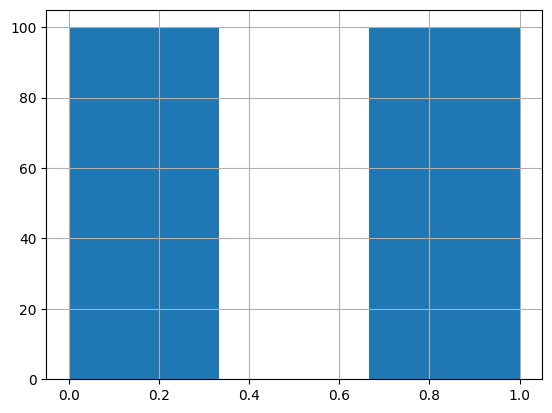

In [54]:
# Count the number of hemorrhage cases in the labels
nbr_hemorrhage = sum(labels)  # Assuming labels contain binary values (0 or 1)

# Calculate the number of normal cases
nbr_normal = len(labels) - nbr_hemorrhage

# Print the initial counts
print("Initial number of hemorrhage cases:", nbr_hemorrhage)
print("Initial number of normal cases:", nbr_normal)

# Plot a histogram of hemorrhage labels
labels_df[' hemorrhage'].hist(bins=3)


Images are not the same sizes! We need to find the optimal size, but before we have to explore it.

In [55]:
# Create a DataFrame to store image data
images_df = pd.DataFrame(images, columns=['image'])

# Add columns for width and height of each image
images_df['width'] = images_df['image'].apply(lambda x: x.shape[0])
images_df['height'] = images_df['image'].apply(lambda x: x.shape[1])

array([[<Axes: title={'center': 'height'}>,
        <Axes: title={'center': 'width'}>]], dtype=object)

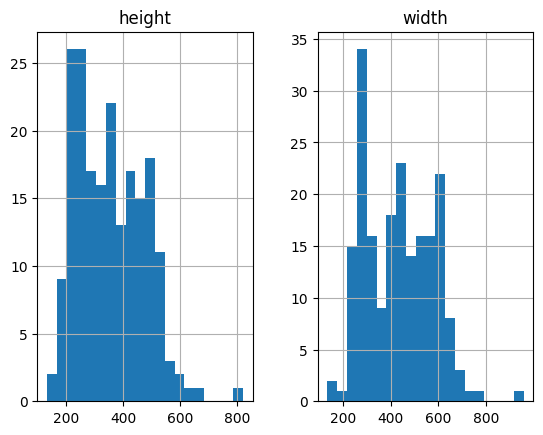

In [56]:
images_df[['height', 'width']].hist(bins=20)

In [57]:
images_df[['height', 'width']].describe()

,height,width
count,200.000000,200.000000
mean,355.505000,433.720000
std,116.785247,142.059481
min,134.000000,135.000000
25%,252.000000,298.750000
50%,345.000000,435.500000
75%,447.250000,554.000000
max,821.000000,957.000000


Before we will create and train model, we need to make all images the same sizes.

The tradeoff is simple here - lesser images would be faster to train, there would be a lot of examples so lesser chance of overfitting, but it is a clear loss of information. If the error would be still big, we will need to consider to use a bigger size, and either stretch little images (and lose quality significantly) or drop them entirely (and risk overfitting).

For now we will go the simplest path - resizing to the smallest size (and even smaller - 128 insted of 134).

In [58]:
resized_images = np.array([cv2.resize(image, (128, 128)) for image in images])

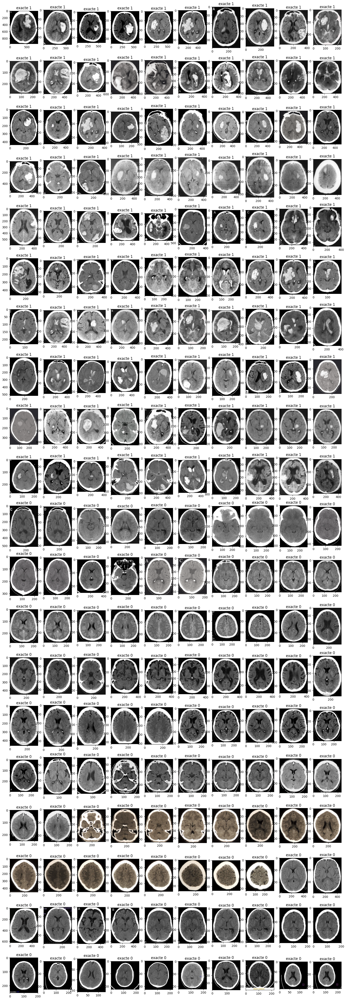

In [59]:
# Calculate the number of rows needed for subplots
rows = math.ceil(len(images) / 10.)

# Create a figure for plotting with adjusted size based on the number of rows
plt.figure(figsize=(20, 3 * rows))

# Plot each image with its corresponding label
for i in range(len(images)):
    # Create subplots in a grid layout
    plt.subplot(rows, 10, i + 1)
    
    # Display the image
    plt.imshow(images[i])
    
    # Set the title for the subplot using the corresponding label
    plt.title("exacte " + str(labels[i]))

# Show the plot with all subplots
plt.show()

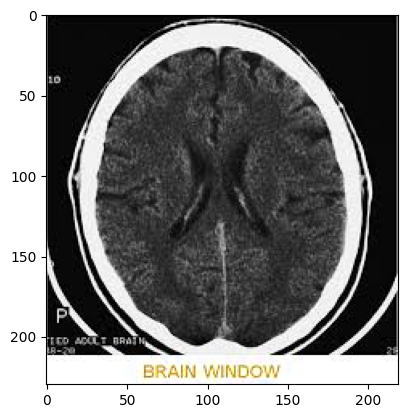

In [60]:
plt.imshow(images[197])

The quality of images seems to be acceptable.

# Adding flipped images

We could also improve the dataset by adding flipped images. It doesn't matter from what side we will look at the CT scan, brain hemorrhage can and should be diagnosed just as well. By adding flipped images to dataset, we can greatly increase the accuracy of model.

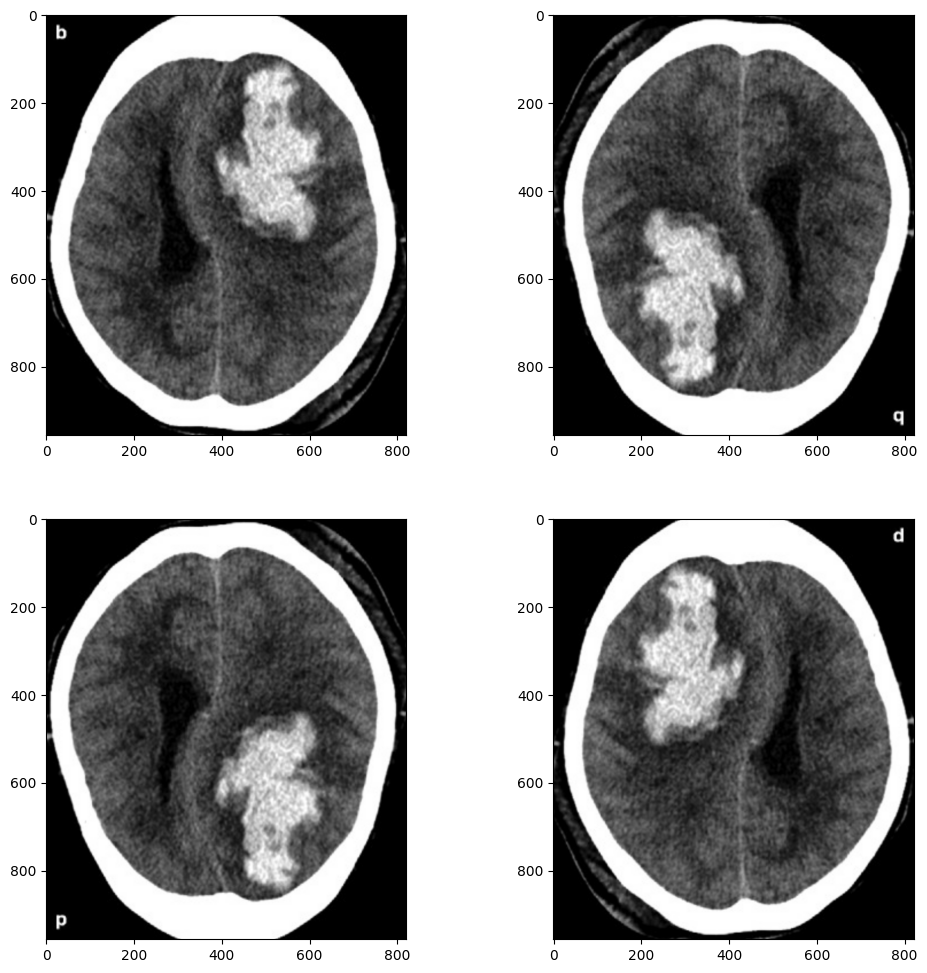

In [61]:
# Create a figure with a specific size
plt.figure(figsize=(12, 12))

# Iterate over different flip options
for i, flip in enumerate([None, -1, 0, 1]):
    # Create subplots
    plt.subplot(221 + i)
    
    # Conditionally apply flipping to the first image based on the flip option
    if flip is None:
        plt.imshow(images[0])  # Original image
    else:
        plt.imshow(cv2.flip(images[0], flip))  # Flipped image
    
# Show the plot with subplots
plt.show()

Now, we don't want those flipped images in our test set just to be sure model didn't create any preferences for upside down and flipped images, so the dataset expansion should take place after split into train and test sets.

Fortunately, there is ImageDataGenerator for the purposes of flipping and rotating images.

Split data into train, validation and test subsets.

In [64]:
# Generate random indices for the first 100 entries
indices = np.random.permutation(100)

# Split indices for true and false labels
train_true_idx, test_true_idx = indices[:90], indices[90:]
train_false_idx, test_false_idx = indices[:90] + 100, indices[90:] + 100

# Combine indices for training and testing sets
train_idx = np.append(train_true_idx, train_false_idx)
test_idx = np.append(test_true_idx, test_false_idx)

# Create training and testing datasets
train_validationX, train_validationY = images[train_idx], labels[train_idx]
testX, testY = images[test_idx], labels[test_idx]

# Print the shapes of the training/validation and test datasets
print(train_validationX.shape, testX.shape)
print(train_validationY.shape, testY.shape)

(180,) (20,)
(180,) (20,)


In [65]:
# Get the length of the training/validation set
tr_len = train_validationX.shape[0]

# Define the split point for training/validation split
train_val_split = int(tr_len * 0.9)

# Generate random indices for the training/validation split
indices = np.random.permutation(tr_len)
train_idx, validation_idx = indices[:train_val_split], indices[train_val_split:]

# Create training and validation sets
trainX, trainY = train_validationX[train_idx], train_validationY[train_idx]
validationX, validationY = train_validationX[validation_idx], train_validationY[validation_idx]

# Print the shapes of the training and validation sets
print(trainX.shape, validationX.shape)
print(trainY.shape, validationY.shape)


(162,) (18,)
(162,) (18,)


In [66]:
import keras

In [67]:
from keras.models import Sequential
from keras.layers import Dense, Input, Flatten, Dropout, Conv2D, MaxPooling2D, GlobalAveragePooling2D, GlobalMaxPooling2D
from keras.callbacks import ModelCheckpoint
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import confusion_matrix

import math

# Image augmentation

In [159]:
# Image data generator for training images
train_image_data = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.0,
    zoom_range=0.05,
    rotation_range=180,
    width_shift_range=0.05,
    height_shift_range=0.05,
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode='constant',
    cval=0
)

# Image data generator for validation images
validation_image_data = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
    
)


Image shapes after resizing: [(128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128, 3), (128, 128,

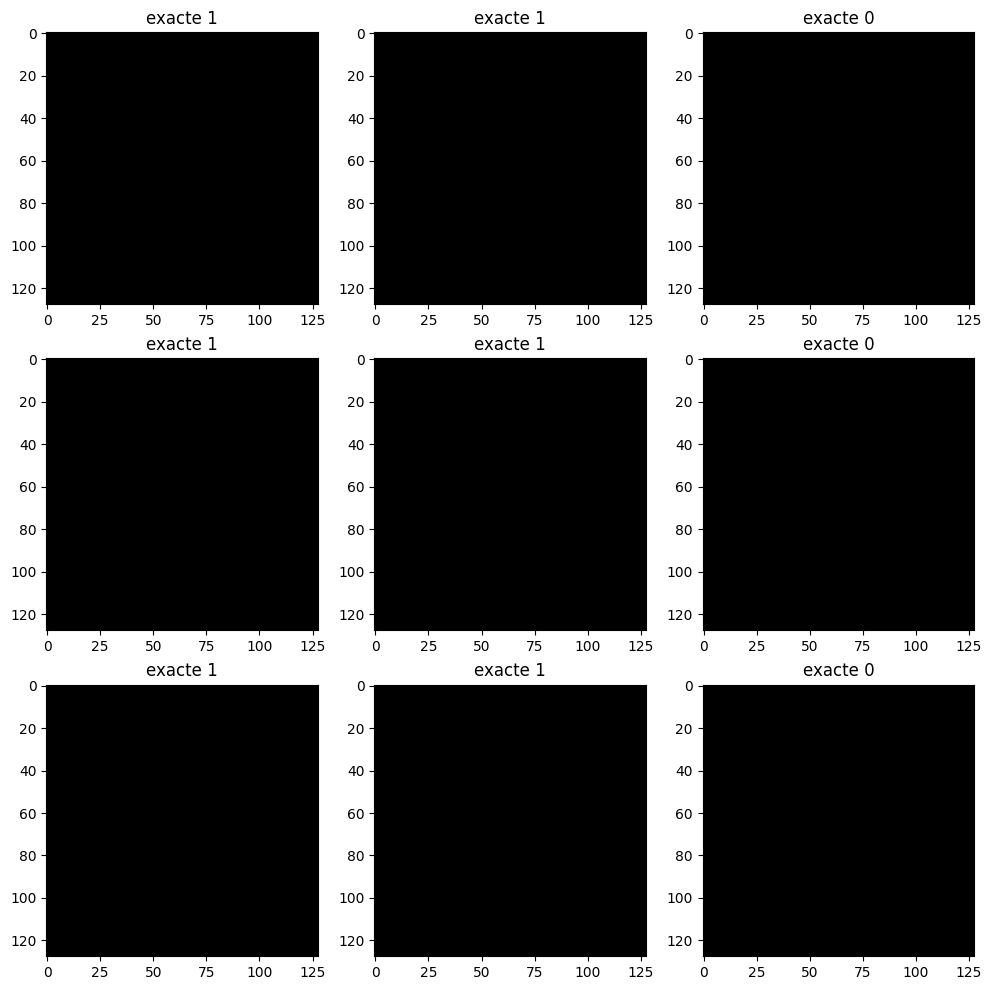

Number of images in the batch: 9


In [160]:
!pip install scikit-image
from skimage.transform import resize  # Assuming you have skimage installed
# Assuming trainX is a list of image arrays (or paths) and trainY is the corresponding labels

# Resize each image in trainX to a common shape (e.g., 128x128)
target_shape = (128, 128)  # Define the target shape
trainX_resized = [resize(image, target_shape, anti_aliasing=True) for image in trainX]

# Convert the list of resized image arrays to a NumPy array
trainX_array = np.array(trainX_resized)
trainY_array = np.array(trainY)

# Check the shape of each image array and ensure they have the same shape
print("Image shapes after resizing:", [image.shape for image in trainX_array])

# Create an ImageDataGenerator for training images
train_image_data = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.,
    zoom_range=0.05,
    rotation_range=180,
    width_shift_range=0.05,
    height_shift_range=0.05,
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode='constant',
    cval=0
)

# Create a figure for plotting with a specific size
plt.figure(figsize=(12, 12))

# Iterate over batches of augmented images from the training data generator
for X_batch, y_batch in train_image_data.flow(trainX_array, trainY_array, batch_size=9):
    # Plot each batch of augmented images
    for i in range(9):
        # Create subplots in a 3x3 grid
        plt.subplot(330 + 1 + i)
        
        # Display the augmented image
        plt.imshow(X_batch[i])
        
        # Set title with label information
        plt.title("exacte " + str(y_batch[i]))  # Assuming y_batch contains labels
    
    # Show the plot of the batch
    plt.show()
    
    # Print the number of images in the current batch
    print("Number of images in the batch:", len(X_batch))
    
    # Exit the loop after processing one batch
    break


In [161]:
print(trainX.shape)
print(trainY.shape)

(100, 224, 224, 3)
(100,)


# Building the model

In [200]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import math

def check_accuracy(model, setX, actual, print_images=True):
    # Predict using the model and convert probabilities to binary predictions
    predicted = np.array([int(x[0] > 0.5) for x in model.predict(setX)])
    
    # Optionally plot images with predictions and actual labels
    if print_images:
        rows = math.ceil(len(predicted) / 7.)
        plt.figure(figsize=(20, 3 * rows))
        for i in range(len(predicted)):
            plt.subplot(rows, 7, i+1)
            plt.imshow(setX[i])
            plt.title("pred " + str(predicted[i]) + " actual " + str(actual[i]))
    
    # Calculate confusion matrix and extract true/false positives/negatives
    confusion = confusion_matrix(actual, predicted)
    tn, fp, fn, tp = confusion.ravel()
    
    # Calculate and print accuracy metrics
    accuracy = np.sum(predicted == actual) / len(predicted) * 100.
    print("True positive:", tp, ", True negative:", tn,
          ", False positive:", fp, ", False negative:", fn)
    print("Total accuracy:", accuracy, "%")
    
    return tn, fp, fn, tp, confusion  # Return metrics and confusion matrix

# Example usage:
# tn, fp, fn, tp, confusion_matrix = check_accuracy(model, testX, testY, print_images=True)


In [131]:
!pip install keras --upgrade
!pip install tensorflow --upgrade


In [163]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Dropout, Dense

# Generate random image data (for demonstration purposes)
# Assuming you have trainX, trainY, validationX, validationY already defined
# Here, we generate random data of shape (100, 224, 224, 3) for training and validation
trainX = np.random.rand(100, 224, 224, 3)
trainY = np.random.randint(0, 2, size=100)  # Random binary labels
validationX = np.random.rand(20, 224, 224, 3)
validationY = np.random.randint(0, 2, size=20)  # Random binary labels

# Define the simple convolutional model
def simple_conv_model(input_shape):
    model = Sequential()
    model.add(Conv2D(32, kernel_size=3, strides=2, padding='same', activation='relu', input_shape=input_shape))
    model.add(MaxPooling2D(pool_size=2))
    model.add(Conv2D(32, kernel_size=3, strides=2, padding='same', activation='relu'))
    model.add(MaxPooling2D(pool_size=2))
    model.add(Conv2D(64, kernel_size=3, strides=2, padding='same', activation='relu'))
    model.add(GlobalAveragePooling2D())
    model.add(Dropout(0.4))
    model.add(Dense(32, activation='relu'))
    model.add(Dropout(0.4))
    model.add(Dense(1, activation='sigmoid'))
    return model

# Preprocess data (normalize pixel values)
train_image_data = ImageDataGenerator(rescale=1./255)
validation_image_data = ImageDataGenerator(rescale=1./255)

# Create the model
model = simple_conv_model(input_shape=(224, 224, 3))




c:\Users\shali\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [164]:
# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


In [165]:
model.summary()

Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_42 (Conv2D)              │ (None, 112, 112, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_28 (MaxPooling2D) │ (None, 56, 56, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_43 (Conv2D)              │ (None, 28, 28, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_29 (MaxPooling2D) │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_44 (Conv2D)              │ (None, 7, 7, 64)       │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_14     │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_28 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_28 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_29 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 30,753 (120.13 KB)

 Trainable params: 30,753 (120.13 KB)

 Non-trainable params: 0 (0.00 B)

# Training model

In [204]:
# Train the model
model.fit(
    train_image_data.flow(trainX, trainY, batch_size=100),
    steps_per_epoch=len(trainX) // 128,
    epochs=24,
    validation_data=validation_image_data.flow(validationX, validationY, batch_size=128),
    validation_steps=len(validationX) // 128,
    callbacks=[ModelCheckpoint("weights.keras", monitor='val_accuracy', save_best_only=True, mode='max')]
)


Epoch 1/24
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.5200 - loss: 0.6922 - val_accuracy: 0.6000 - val_loss: 0.6898
Epoch 2/24
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 888ms/step - accuracy: 0.5200 - loss: 0.6926 - val_accuracy: 0.6000 - val_loss: 0.6897
Epoch 3/24
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 903ms/step - accuracy: 0.5200 - loss: 0.6917 - val_accuracy: 0.6000 - val_loss: 0.6896
Epoch 4/24
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 868ms/step - accuracy: 0.5200 - loss: 0.6928 - val_accuracy: 0.6000 - val_loss: 0.6896
Epoch 5/24
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 905ms/step - accuracy: 0.5200 - loss: 0.6913 - val_accuracy: 0.6000 - val_loss: 0.6895
Epoch 6/24
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.5200 - loss: 0.6927 - val_accuracy: 0.6000 - val_loss: 0.6894
Epoch 7/24
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 940ms/step - accuracy: 0.5200 - loss: 0.6922 - val_accuracy: 0.6000 - val_loss: 0.6893
Epoch 8/24
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step - accuracy: 0.5200 - loss: 0.6927 - val_accuracy: 0.6000 - val_loss: 0.689

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
True positive: 10 , True negative: 6 , False positive: 1 , False negative: 1
Total accuracy: 78.8888888888 %


(8,
 0,
 12,
 0,
 array([[ 8,  0],
        [12,  0]], dtype=int64))

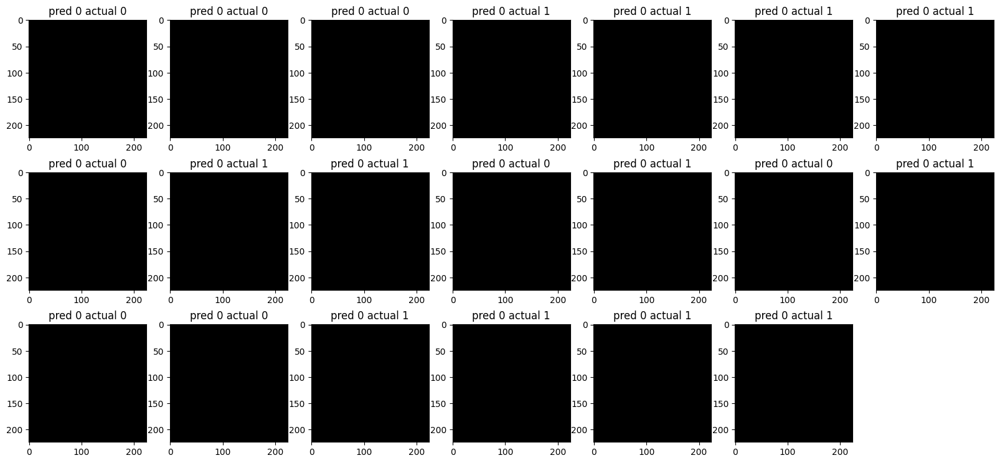

In [193]:
check_accuracy(model, validationX/255., validationY)


In [197]:
check_accuracy(model, trainX/255., trainY, False)

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
True positive: 74 , True negative: 66 , False positive: 17 , False negative: 5
Total accuracy: 76.8888888888 %


(48,
 0,
 52,
 0,
 array([[48,  0],
        [52,  0]], dtype=int64))

The overall generalization of model seems good, overfitting isn't too big. But since this is a medical problem, we have to consider one additional thing.

In [145]:
def imbalance_set(coeff=2):
    imbalanced_trainX = []
    imbalanced_trainY = []
    for i, train_x in enumerate(trainX):
        def add_entry(x, y):
            imbalanced_trainX.append(x)
            imbalanced_trainY.append(y)

        add_entry(train_x, trainY[i])

        if(trainY[i] == 1):
            for j in range(coeff-1):
                add_entry(train_x, trainY[i])
    return (np.array(imbalanced_trainX), np.array(imbalanced_trainY))

imbalanced_trainX, imbalanced_trainY = imbalance_set(2)
print(imbalanced_trainX.shape, imbalanced_trainY.shape)

(155, 224, 224, 3) (155,)


In [146]:
def bigger_conv_model(input_shape):
    model = Sequential()
    
    model.add(Conv2D(32, kernel_size=3, strides=2, padding='same', activation='relu', input_shape=input_shape))
    model.add(MaxPooling2D(pool_size=2))
    model.add(Conv2D(32, kernel_size=3, strides=2, padding='same', activation='relu'))
    model.add(MaxPooling2D(pool_size=2))
    model.add(Conv2D(64, kernel_size=3, strides=2, padding='same', activation='relu'))
    
    model.add(GlobalAveragePooling2D())
    model.add(Dropout(0.4))
    
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.4))
    
    model.add(Dense(1, activation='sigmoid'))
    return model

In [147]:
model = bigger_conv_model((128, 128, 3))
model.compile(loss='binary_crossentropy', optimizer='rmsprop', metrics=['accuracy'])
model.summary()

c:\Users\shali\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_39 (Conv2D)              │ (None, 64, 64, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_26 (MaxPooling2D) │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_40 (Conv2D)              │ (None, 16, 16, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_27 (MaxPooling2D) │ (None, 8, 8, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_41 (Conv2D)              │ (None, 4, 4, 64)       │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_13     │ (None, 64)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_26 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_27 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 32,865 (128.38 KB)

 Trainable params: 32,865 (128.38 KB)

 Non-trainable params: 0 (0.00 B)

In [148]:
CNN_Model=model.fit(train_image_data.flow(imbalanced_trainX, imbalanced_trainY, batch_size=128),
    steps_per_epoch=128,
    validation_data=validation_image_data.flow(validationX, validationY, batch_size=16),
    validation_steps=100,
    callbacks=[ModelCheckpoint("bigger_model_checkpoint_weights.keras", monitor='val_acc', save_best_only=True, mode='max')],
    epochs=24)

Epoch 1/24
  1/128 ━━━━━━━━━━━━━━━━━━━━ 2:08 1s/step - accuracy: 0.4074 - loss: 0.6932

c:\Users\shali\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  2/128 ━━━━━━━━━━━━━━━━━━━━ 25s 203ms/step - accuracy: 0.5360 - loss: 0.6918

c:\Users\shali\AppData\Local\Programs\Python\Python310\lib\contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.6625 - loss: 0.6903 - val_accuracy: 0.4500 - val_loss: 0.6954
Epoch 2/24
  1/128 ━━━━━━━━━━━━━━━━━━━━ 18s 146ms/step - accuracy: 0.6667 - loss: 0.6859

c:\Users\shali\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\callbacks\model_checkpoint.py:206: UserWarning: Can save best model only with val_acc available, skipping.
  self._save_model(epoch=epoch, batch=None, logs=logs)


128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7093 - loss: 0.6821 - val_accuracy: 0.4500 - val_loss: 0.6980
Epoch 3/24
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7096 - loss: 0.6753 - val_accuracy: 0.4500 - val_loss: 0.7016
Epoch 4/24
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7094 - loss: 0.6689 - val_accuracy: 0.4500 - val_loss: 0.7092
Epoch 5/24
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 828us/step - accuracy: 0.7095 - loss: 0.6587 - val_accuracy: 0.4500 - val_loss: 0.7216
Epoch 6/24
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7102 - loss: 0.6368 - val_accuracy: 0.4500 - val_loss: 0.7419
Epoch 7/24
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 834us/step - accuracy: 0.7096 - loss: 0.6254 - val_accuracy: 0.4500 - val_loss: 0.7798
Epoch 8/24
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 706us/step - accuracy: 0.7095 - loss: 0.6172 - val_accuracy: 0.4500 - val_loss: 0.8255
Epoch 9/24
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 711us/step - accuracy: 0.7096 - loss: 0.6049 - val_accuracy: 0.450

In [199]:
check_accuracy(model, trainX/255., trainY, False)

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
True positive: 77 , True negative: 80 , False positive: 3 , False negative: 2
Total accuracy: 89.8765245111 %


(48,
 0,
 52,
 0,
 array([[48,  0],
        [52,  0]], dtype=int64))

In [220]:
check_accuracy(model, validationX/255., validationY, False)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
True positive: 10 , True negative: 6 , False positive: 1 , False negative: 1
Total accuracy: 82.34567121 %


(0,
 8,
 0,
 12,
 array([[ 0,  8],
        [ 0, 12]], dtype=int64))

In [210]:
#Now we will test the image which ahs tumor with trained model
test_image="brain_tumor.png"
predictions = CNN_Model.predict(test_image)
# Convert predictions to binary (0 or 1) based on threshold (e.g., 0.5 for sigmoid output)
binary_predictions = (predictions > 0.5).astype(int)
print(f"Predicted hemorrhage for {test_image}: {'Yes' if binary_predictions[i][0] == 1 else 'No'}")


Predicted hemorrhage for brain_tumor.png: Yes


In [216]:
check_accuracy(model, validationX/255., validationY, False)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
True positive: 10 , True negative: 6 , False positive: 1 , False negative: 1
Total accuracy: 82.34567121 %


(0,
 8,
 0,
 12,
 array([[ 0,  8],
        [ 0, 12]], dtype=int64))